In [1]:
#Script to segment flow images. It requires 4 data sets: 1: the dry image for registration, 2: the flow image, 3: the wet image, and 4: the segmented dry scan 

#files needed to run the processing. NB utils is a package that Dane helped me make. It includes some important functions in it. 
import utils
import skimage
import numpy as np
import matplotlib.pyplot as plt
import PIL
from PIL import Image, ImageDraw

#dealing with saving tif files 
import os
import tifffile as tif
import ipywidgets as widgets
from scipy import sparse


from skimage import data, img_as_float, img_as_ubyte, exposure
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage.measure import label, regionprops
from skimage.color import label2rgb


from itkwidgets import view


### Functions needed to run this analysis 

In [2]:

#filtering 
def nlm_denoise(Img,patch,dist):
    
    def nlm_denoise_wrap(array):
        correct=img_as_float(array[0])
        sigma_est = np.mean(estimate_sigma(correct))
        correct = denoise_nl_means(correct, h=2 * sigma_est, sigma=sigma_est,fast_mode=True,patch_size=patch, patch_distance=dist)
        return correct[np.newaxis, ...]
    
    denoise=skimage.util.apply_parallel(nlm_denoise_wrap,Img, chunks=(1, Img.shape[1],Img.shape[2]), dtype='float',compute=True)
    
    return  denoise

#plot 3 images side by side (used for high, low and imbibition plots)
def plot(img1, img2, img3, x_pos): 
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 20),
                       sharex=True, sharey=True)

    if x_pos > 0: 
        ax[0].imshow(img1[x_pos,200:800,400:1000],cmap='gray') #previous 300:900
        ax[0].axis('off')

        ax[1].imshow(img2[x_pos,200:800,400:1000],cmap='gray')
        ax[1].axis('off')

        ax[2].imshow(img3[x_pos,200:800,400:1000],cmap='gray')
        ax[2].axis('off')
        fig.tight_layout()
        plt.show()
 
    else: 
        ax[0].imshow(img1[200:800,400:1000],cmap='gray') #previous 300:900
        ax[0].axis('off')

        ax[1].imshow(img2[200:800,400:1000],cmap='gray')
        ax[1].axis('off')

        ax[2].imshow(img3[200:800,400:1000],cmap='gray')
        ax[2].axis('off') 
        fig.tight_layout()
        plt.show() 

    #fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20),
    #                    sharex=True, sharey=True)

    #ax[0].imshow(denoise_flow[12,80:-50,100:-20],cmap='gray')
    #ax[0].axis('off')


    #ax[1].imshow(denoise_flow_low[12,80:-50,100:-20],cmap='gray')
    #ax[1].axis('off')

    #fig.tight_layout()
    #plt.show()


#create boolean array
def make_bool(seg_image, rock = None): 
    gas_image = np.zeros_like(seg_image)
    gas_image[seg_image == 1] = 1
    gas_image = gas_image.astype(np.bool8)

    wat_image = np.zeros_like(seg_image)
    wat_image[seg_image == 2] = 1
    wat_image = wat_image.astype(np.bool8)   

    if rock is not None:
        grain = np.zeros_like(seg_image)
        grain[seg_image == 3] = 1
        grain = grain.astype(np.bool8)   

        return(gas_image, wat_image, grain)
    
    else: 
        return(gas_image, wat_image)


#saturation calculation 
def sat_calc(gas_image, wat_image, rock_image=None):
    gas_sat     = []
    wat_sat     = []
    phi = []
    gas_value   = 1 

    for i in range(0,gas_image.shape[0]):
        gas_pixels   = sum(sum(gas_image[i,:,:]==gas_value)) 
        wat_pixels   = sum(sum(wat_image[i,:,:]==gas_value)) 
        if rock_image is not None: 
            rock_pixels  = sum(sum(rock_image[i,:,:]==gas_value))  
            phi.append((gas_pixels+wat_pixels)/ rock_pixels)

        gas_sat.append(gas_pixels/(gas_pixels+wat_pixels))
        wat_sat.append(wat_pixels/(gas_pixels+wat_pixels))
        

    gas_sat.reverse()
    wat_sat.reverse()
    N= len(gas_sat)
    voxel = 20 *10**-3 # in mm 
    x = np.linspace(0, int(N* voxel), N)
    plt.plot(x, gas_sat)
    plt.ylim(0,0.5)
    plt.ylabel('Gas saturation [-]')
    plt.xlabel('Distance from inlet [mm] ')

    if rock_image is not None: 
        phi.reverse()
        return(gas_sat, wat_sat, phi)
    else: 
        return(gas_sat, wat_sat)

#trapping curve 
def trapping_curve(initial1,residual1, initial2, residual2):
    plt.plot(initial1,residual1,'rx')
    plt.plot(initial2,residual2,'bo')
    x = np.linspace(0, 0.4, 10)
    y = x 
    plt.plot(x,y)
    plt.plot(x,y*0.7)

    plt.xlabel('Initial gas saturation')
    plt.ylabel('Residual gas saturation')
    plt.show()


# zoom in plots
def plot_zoom(img1, img2, seg_image1, seg_image2, x_pos): 
    seg_1  = utils.sanity_check(utils.preprocess(img1[x_pos,:,:]), seg_image1[x_pos,:,:]==1, 0.35)
    seg_2  = utils.sanity_check(utils.preprocess(img2[x_pos,:,:]), seg_image2[x_pos,:,:]==1, 0.35)


    fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 20),
                       sharex=False, sharey=False)

    if x_pos > 0: 
        ax[0][0].imshow(img1[x_pos,50:-50,70:-20], vmin=0, vmax=110, cmap='gray') #previous 300:900
        ax[0][0].axis('off')

        ax[0][1].imshow(img2[x_pos,50:-50,70:-20], vmin=0, vmax=110/255, cmap='gray')
        ax[0][1].axis('off')

        ax[1][0].imshow(img1[x_pos,400:800,400:800], vmin=0, vmax=110, cmap='gray')
        ax[1][0].axis('off')

        ax[1][1].imshow(img2[x_pos,400:800,400:800], vmin=0, vmax=110/255, cmap='gray')
        ax[1][1].axis('off')

        ax[2][0].imshow(seg_1[400:800,400:800], vmin=1/255, vmax=110/255)
        ax[2][0].axis('off')

        ax[2][1].imshow(seg_2[400:800,400:800], vmin=1/255, vmax=110/255)
        ax[2][1].axis('off')


        fig.tight_layout()
        plt.show()



#crop to a clyinder to remove things outside the FoV 
def crop(image1):

    img = image1
    img = (img - img.min()) / (img.max() - img.min()) * 255
    img = img.astype(np.uint8)

    # creating cylindrical mask
    h,w = img.shape[1:]
    z   = img.shape[0]
    lum_img = Image.new('L',[h,w] ,0)
    draw = ImageDraw.Draw(lum_img)
    draw.pieslice([(135,90),(h-75,w-75)],0,360,fill=255)
    mask = np.array(lum_img)
    mask = np.repeat(mask[np.newaxis, :, :], 3, axis=0)
    mask = (mask == 0)

    print(img.shape)
    print(mask.shape)
    assert img.shape == mask.shape
    assert mask.dtype == np.bool8
        
    # convert grayscale image to rgb
    img  = img.transpose(1, 2, 0)
    mask = mask.transpose(1, 2, 0)
    background = np.array(PIL.Image.fromarray(img.astype(np.uint8)).convert("RGB"))
    #background = np.array(PIL.Image.fromarray(img).convert("RGB"))
    print(background.shape)
    print(mask.shape)


    # create red foreground with alpha 0.5 from mask
    foreground = background.copy()
    foreground[mask] = 255 #(255, 0, 0)

    # create a composite image using the alpha layer
    composite = background * (1.0) + foreground
    final = np.array(foreground, dtype=np.uint8)

    #cropped_img = final[500:700, 500:700, :]
    plt.figure()
    plt.imshow(final[:,:,1], cmap='gray')
    return final


### Analysis of H2L 

In [3]:
start_slice = 0
slices      = 200 
CF          = 12 # 12 slice leeway for the flow scan segmentations which you should not forget about!!! 


flow_data_9 = utils.load(dirname = 'E:\\New reconstructions\\merged\\merged\\09_h2lh_merged', start_slice=start_slice, slices=slices)
denoise_flow_9 = nlm_denoise(flow_data_9.astype(np.float32), patch = 3,  dist = 6)

flow_data_11 = utils.load(dirname = 'E:\\New reconstructions\\merged\\merged\\11_h2ll_2_merged', start_slice=start_slice, slices=slices)
denoise_flow_11 = nlm_denoise(flow_data_11.astype(np.float32), patch = 3,  dist = 6)

seg_image9  = skimage.io.imread('E:\\New reconstructions\\segmented\\fully_segmented\\merged_segmented_flow_09_h2lh_merged.tif')
seg_image9  = seg_image9[(start_slice-CF):(start_slice + slices-CF), :, : ]

seg_image11  = skimage.io.imread('E:\\New reconstructions\\segmented\\fully_segmented\\merged_segmented_flow_11_h2ll_2_merged.tif')
seg_image11  = seg_image11[(start_slice-CF):(start_slice + slices-CF), :, : ]



In [15]:
x_pos       = 50

plot_zoom(img1 = flow_data_9, img2= denoise_flow_9, seg_image1 = seg_image9, seg_image2 = seg_image9, x_pos = x_pos)
    


NameError: name 'flow_data_9' is not defined

### Analysis of L2H 

In [4]:
start_slice = 0
slices      = 200 
CF          = 12 # 12 slice leeway for the flow scan segmentations which you should not forget about!!! 


flow_data_29 = utils.load(dirname = 'E:\\New reconstructions\\merged\\merged\\29_2_l2hl_merged', start_slice=start_slice+CF, slices=slices)
denoise_flow_29 = nlm_denoise(flow_data_29, patch = 3,  dist = 6)

flow_data_30 = utils.load(dirname = 'E:\\New reconstructions\\merged\\merged\\30_l2hh_merged', start_slice=start_slice+CF, slices=slices)
denoise_flow_30 = nlm_denoise(flow_data_30, patch = 3,  dist = 6)




In [25]:
seg_image29  = skimage.io.imread('E:\\New reconstructions\\segmented\\bottom_redone\\segmented_flow_29_2_l2hl_merged.tif')
seg_image29  = seg_image29[(start_slice):(start_slice + slices), :, : ]

seg_image30  = skimage.io.imread('E:\\New reconstructions\\segmented\\bottom_redone\\segmented_flow_30_l2hh_merged.tif')
seg_image30  = seg_image30[(start_slice):(start_slice + slices), :, : ]

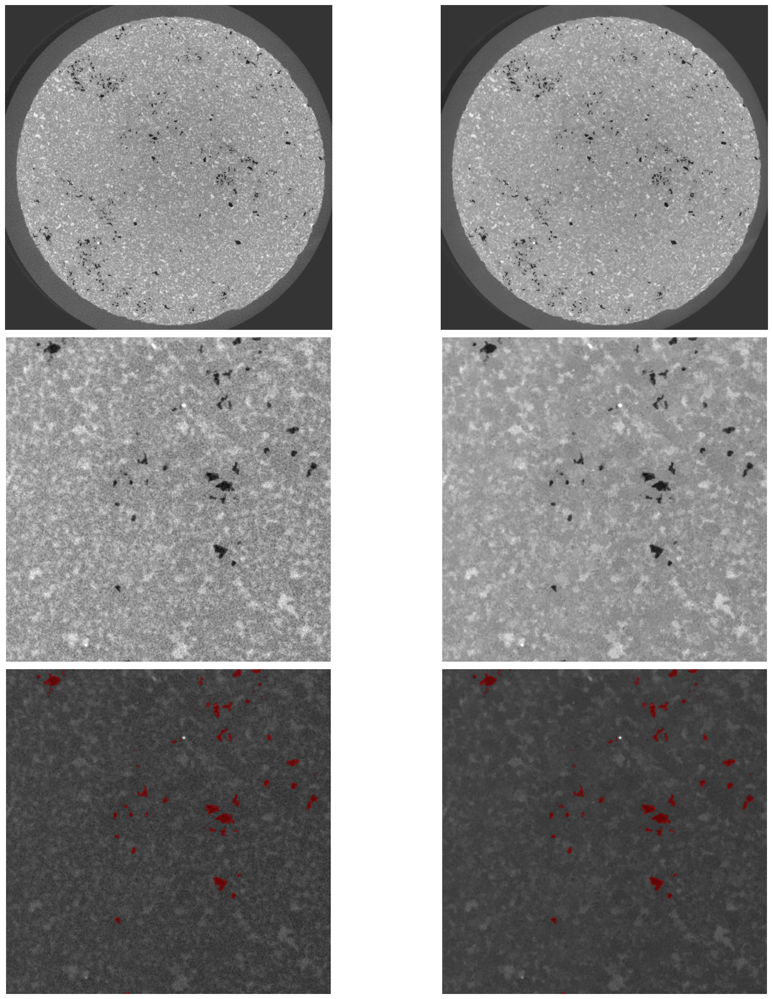

In [27]:

#plotting 
# x = 12 or 66 in the other plots 
x_pos       = 20

# zoom in plots
def plot_zoom(img1, img2, seg_image1, seg_image2, x_pos): 
    seg_1  = utils.sanity_check(utils.preprocess(img1[x_pos,:,:]), seg_image1[x_pos,:,:]==1, 0.35)
    seg_2  = utils.sanity_check(utils.preprocess(img2[x_pos,:,:]), seg_image2[x_pos,:,:]==1, 0.35)


    fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 20),
                       sharex=False, sharey=False)

    if x_pos > 0: 
        ax[0][0].imshow(img1[x_pos,50:-50,70:-20], vmin=0, vmax=110, cmap='gray') #previous 300:900
        ax[0][0].axis('off')

        ax[0][1].imshow(img2[x_pos,50:-50,70:-20], vmin=0, vmax=110/255, cmap='gray')
        ax[0][1].axis('off')

        ax[1][0].imshow(img1[x_pos,400:800,400:800], vmin=0, vmax=110, cmap='gray')
        ax[1][0].axis('off')

        ax[1][1].imshow(img2[x_pos,400:800,400:800], vmin=0, vmax=110/255, cmap='gray')
        ax[1][1].axis('off')

        ax[2][0].imshow(seg_1[400:800,400:800], vmin=1/255, vmax=110/255)
        ax[2][0].axis('off')

        ax[2][1].imshow(seg_2[400:800,400:800], vmin=1/255, vmax=110/255)
        ax[2][1].axis('off')


        fig.tight_layout()
        plt.show()


plot_zoom(img1 = flow_data_30, img2= denoise_flow_30, seg_image1 = seg_image30, seg_image2 = seg_image30, x_pos = x_pos)





### looking at relaxation dynamics for Sharon 

In [68]:
#loads in final scan taken during flow, the first post drainage scan, and the final post drainage scan
flow_data_11 = utils.load(dirname = 'E:\\New reconstructions\\merged\\merged\\11_h2ll_2_merged', start_slice=900, slices=100)
flow_data_12 = utils.load(dirname = 'E:\\New reconstructions\\merged\\merged\\12_dra1_pd1_merged', start_slice=900, slices=100)
flow_data_20 = utils.load(dirname = 'E:\\New reconstructions\\merged\\merged\\20_dra1_pd9_merged', start_slice=900, slices=100)


flow_data_21 = utils.load(dirname = 'E:\\New reconstructions\\merged\\merged\\21_imb1_pi1_merged', start_slice=900, slices=100)
flow_data_24 = utils.load(dirname = 'E:\\New reconstructions\\merged\\merged\\24_imb1_pi4_merged', start_slice=900, slices=100)
flow_data_27 = utils.load(dirname = 'E:\\New reconstructions\\merged\\merged\\27_imb1_pi7_merged', start_slice=900, slices=100)


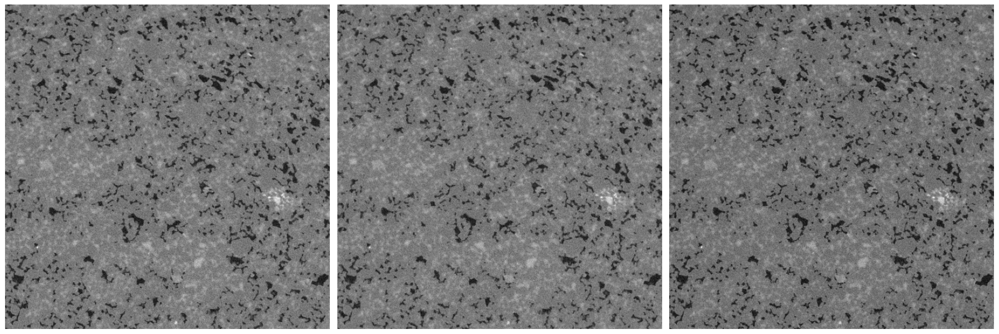

In [5]:
#can filter the data using the nlm_denoise function to make prettier pictures 
plot(flow_data_11, flow_data_12, flow_data_20, x_pos = 62) # x = 12 or 66 in the other plots 

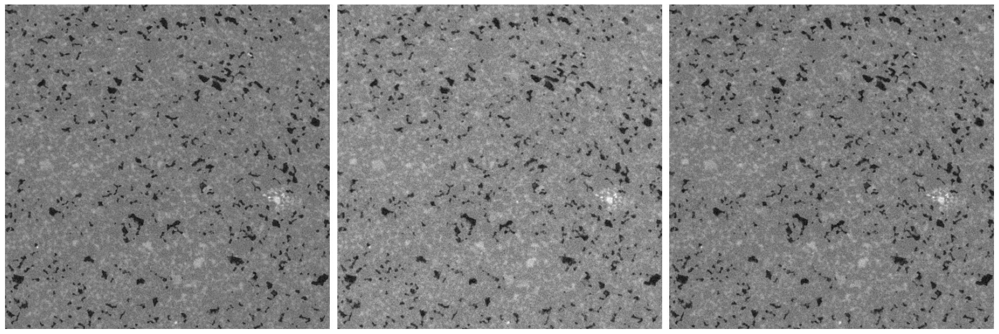

In [69]:
plot(flow_data_21, flow_data_24, flow_data_27, x_pos = 62) # x = 12 or 66 in the other plots 

In [3]:
start_slice=900
slices = 100 
CF = 12 # 12 slice leeway for the flow scan segmentations which you should not forget about!!! 
seg_image11  = skimage.io.imread('E:\\New reconstructions\\segmented\\fully_segmented\\merged_segmented_flow_11_h2ll_2_merged.tif.tif')
seg_image11  = seg_image11[(start_slice-CF):(start_slice + slices-CF), :, : ]

seg_image12  = skimage.io.imread('E:\\New reconstructions\\segmented\\fully_segmented\\merged_segmented_flow_12_dra1_pd1_merged.tif.tif')
seg_image12  = seg_image12[(start_slice-CF):(start_slice + slices-CF), :, : ]

seg_image20  = skimage.io.imread('E:\\New reconstructions\\segmented\\fully_segmented\\merged_segmented_flow_20_dra1_pd9_merged.tif.tif')
seg_image20  = seg_image20[(start_slice-CF):(start_slice + slices-CF), :, : ]




In [151]:
seg_image21  = skimage.io.imread('E:\\New reconstructions\\segmented\\fully_segmented\\merged_segmented_flow_21_imb1_pi1_merged.tif.tif')
seg_image21  = seg_image21[(start_slice-CF):(start_slice + slices-CF), :, : ]

seg_image24  = skimage.io.imread('E:\\New reconstructions\\segmented\\fully_segmented\\merged_segmented_flow_24_imb1_pi4_merged.tif.tif')
seg_image24  = seg_image24[(start_slice-CF):(start_slice + slices-CF), :, : ]

seg_image27  = skimage.io.imread('E:\\New reconstructions\\segmented\\fully_segmented\\merged_segmented_flow_27_imb1_pi7_merged.tif.tif')
seg_image27  = seg_image27[(start_slice-CF):(start_slice + slices-CF), :, : ]

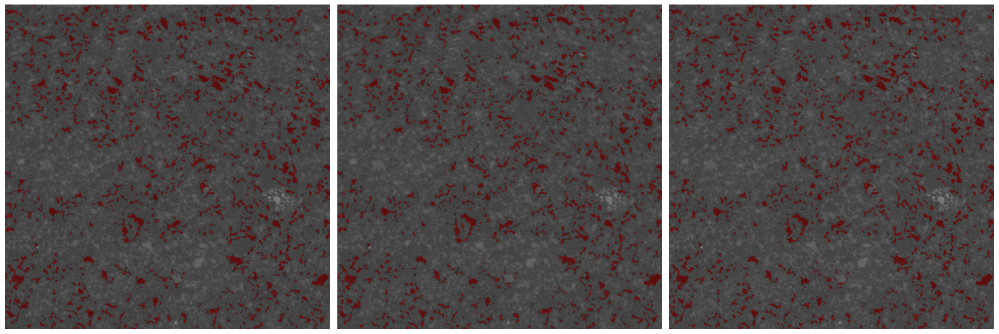

In [67]:
seg_11 = utils.sanity_check(utils.preprocess(flow_data_11[62,:,:]), seg_image11[62,:,:]==1, 0.3)
seg_12 = utils.sanity_check(utils.preprocess(flow_data_12[62,:,:]), seg_image12[62,:,:]==1, 0.3)
seg_20 = utils.sanity_check(utils.preprocess(flow_data_20[62,:,:]), seg_image20[63,:,:]==1, 0.3)
plot(seg_11, seg_12, seg_20, x_pos = 0)

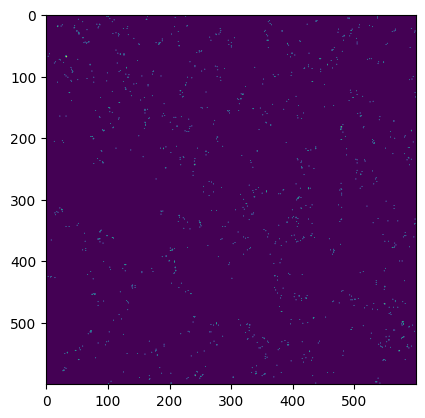

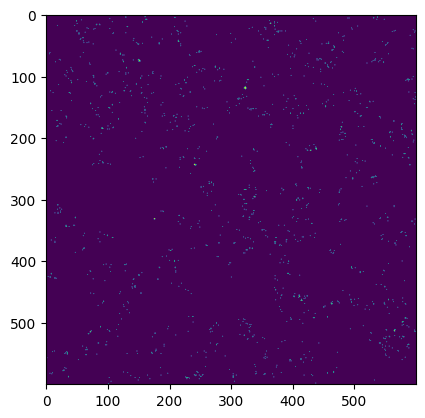

In [113]:
z_pos = 25

seg_21 = utils.sanity_check(utils.preprocess(flow_data_21[z_pos,:,:]), seg_image21[z_pos+1,:,:]==1, 0.3)
seg_24 = utils.sanity_check(utils.preprocess(flow_data_24[z_pos,:,:]), seg_image24[z_pos,:,:]==1, 0.3)
seg_27 = utils.sanity_check(utils.preprocess(flow_data_27[z_pos,:,:]), seg_image27[z_pos,:,:]==1, 0.3)
#plot(seg_21, seg_24, seg_27, x_pos = 0)



plt.imshow((seg_image27[z_pos,200:800,400:1000]==1).astype(np.uint8) -  (seg_image24[z_pos,200:800,400:1000]==1).astype(np.uint8))
plt.show()


plt.imshow((seg_image21[z_pos+1,200:800,400:1000]==1).astype(np.uint8) -  (seg_image24[z_pos,200:800,400:1000]==1).astype(np.uint8))
plt.show()

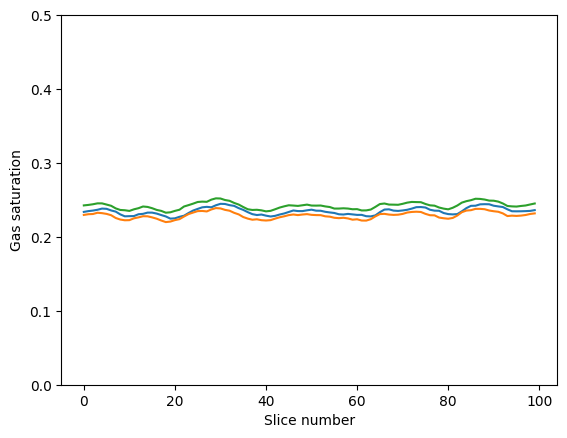

(100, 1400, 1400)


In [152]:
#can adapt to be the small volume vs the whole image 

gas_image21, wat_image21   = make_bool(seg_image21)
gas_sat21, wat_sat21       = sat_calc(gas_image21, wat_image21)

gas_image24, wat_image24   = make_bool(seg_image24)
gas_sat24, wat_sat24       = sat_calc(gas_image24, wat_image24)

gas_image27, wat_image27   = make_bool(seg_image27)
gas_sat27, wat_sat27       = sat_calc(gas_image27, wat_image27)


plt.show()

'''#cube instead of the whole slice (to see if the movement in is significant over noise)
gas_image21, wat_image21   = make_bool(seg_image21[400:800,400:800,400:800])
gas_sat21, wat_sat21       = sat_calc(gas_image21, wat_image21)

gas_image24, wat_image24   = make_bool(seg_image24[20:25,200:800,400:1000])
gas_sat24, wat_sat24       = sat_calc(gas_image24, wat_image24)

gas_image27, wat_image27   = make_bool(seg_image27[20:25,200:800,400:1000])
gas_sat27, wat_sat27       = sat_calc(gas_image27, wat_image27)


plt.show()'''

print(gas_image21.shape)

### Analysis of segmented images

### Saturation 

In [3]:
directory = 'E:\\New reconstructions\\segmented\\fully_segmented\\'

folders = (os.listdir(directory))

#H2L_high  = skimage.io.imread(os.path.join(directory, 'merged_segmented_flow_09_h2lh_merged.tif'))
H2L_low   = skimage.io.imread(os.path.join(directory, 'merged_segmented_flow_11_h2ll_2_merged.tif'))


#gas_H2L_high, wat_H2L_high = make_bool(H2L_high) #set rock if you want the grains as well for the porosity calculation
#del(H2L_high)
gas_H2L_low, wat_H2L_low, rock         = make_bool(H2L_low, rock = 'True')
del(H2L_low)

#L2H_low   = skimage.io.imread(os.path.join(directory, 'merged_segmented_flow_29_2_l2hl_merged.tif'))
#L2H_high  = skimage.io.imread(os.path.join(directory, 'merged_segmented_flow_30_l2hh_merged.tif'))



#gas_L2H_high, wat_L2H_high = make_bool(L2H_high)
#del(L2H_high)
#gas_L2H_low, wat_L2H_low   = make_bool(L2H_low)
#del(L2H_low)





In [12]:
rock = skimage.measure.label(rock)


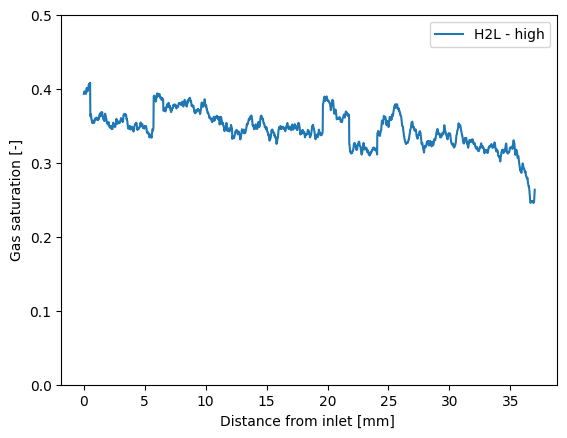

In [4]:
#gas_sat_H2L_high, wat_sat_H2L_high, phi     = sat_calc(gas_H2L_high, wat_H2L_high, rock)
gas_sat_H2L_low, wat_sat_H2L_low, phi       = sat_calc(gas_H2L_low, wat_H2L_low, rock)

#gas_sat_L2H_low, wat_sat_L2H_low       = sat_calc(gas_L2H_low, wat_L2H_low)
#gas_sat_L2H_high, wat_sat_L2H_high     = sat_calc(gas_L2H_high, wat_L2H_high)

plt.legend(['H2L - high', 'H2L - low', 'L2H - low', 'L2H - high'])


### Porosity plot 

Text(0.5, 0, 'Distance from inlet [mm] ')

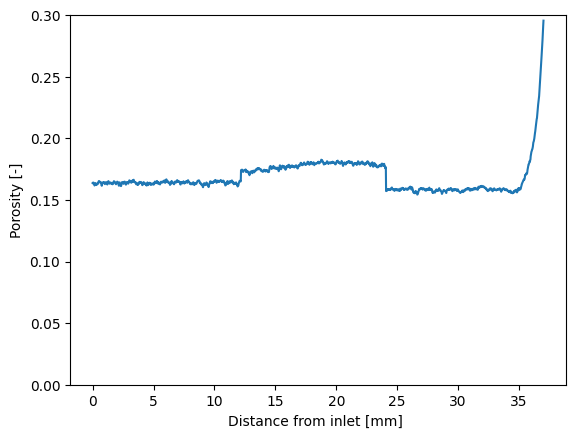

In [5]:
N= len(phi)
voxel = 20 *10**-3 # in mm 
x = np.linspace(0, int(N* voxel), N)
plt.plot(x, phi)
plt.ylim(0,0.3)
plt.ylabel('Porosity [-]')
plt.xlabel('Distance from inlet [mm] ')

In [11]:
print((phi[1000] - phi[100])*100/phi[100])
print(phi[1400])

9.521508586275901
0.15828358918990473


### cross sections through the core 

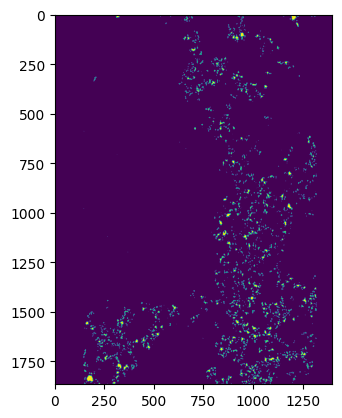

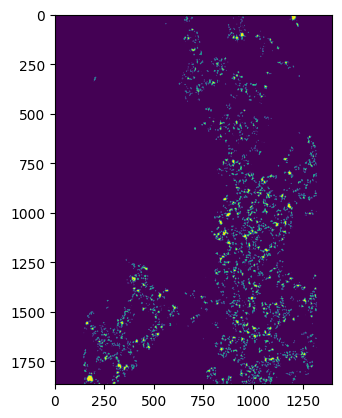

In [5]:
### cross section through the core

plt.imshow(gas_L2H_low[:, 600, :])
plt.show()

plt.imshow(gas_L2H_high[:, 600, :])
plt.show()



### loading in imbibition data 

In [7]:

H2L_imb  = skimage.io.imread(os.path.join(directory, 'merged_segmented_flow_21_imb1_pi1_merged.tif'))


gas_H2L_imb, wat_H2L_imb = make_bool(H2L_imb)
del(H2L_imb)


L2H_imb   = skimage.io.imread(os.path.join(directory, 'merged_segmented_flow_33_imb2_pi1_merged.tif'))

gas_L2H_imb, wat_L2H_imb   = make_bool(L2H_imb)
del(L2H_imb)

gas_sat_H2L_imb, wat_sat_H2L_imb = sat_calc(gas_H2L_imb, wat_H2L_imb)
gas_sat_L2H_imb, wat_sat_L2H_imb = sat_calc(gas_L2H_imb, wat_L2H_imb)



NameError: name 'L2H_low' is not defined

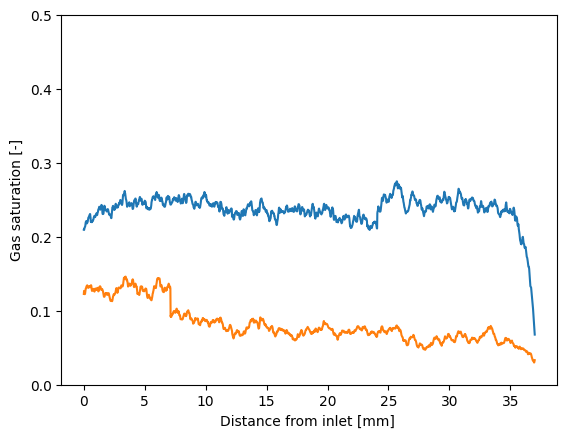

In [8]:
gas_sat_H2L_imb, wat_sat_H2L_imb = sat_calc(gas_H2L_imb, wat_H2L_imb)
gas_sat_L2H_imb, wat_sat_L2H_imb = sat_calc(gas_L2H_imb, wat_L2H_imb)



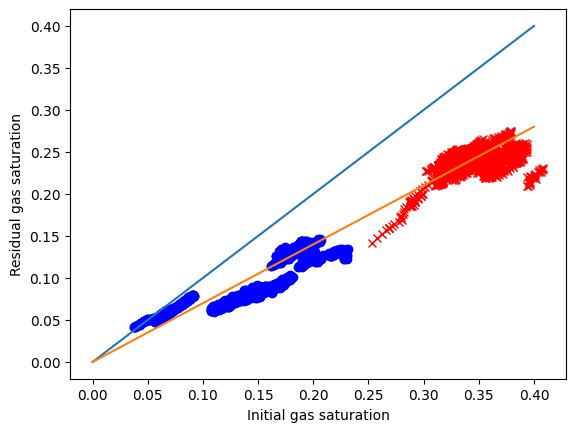

In [13]:

trapping_curve(gas_sat_H2L_low[:-20], gas_sat_H2L_imb[:-20], gas_sat_L2H_high[:-20], gas_sat_L2H_imb[:-20])



### Connectivity analysis


97.20497313329331
97.81263320708979


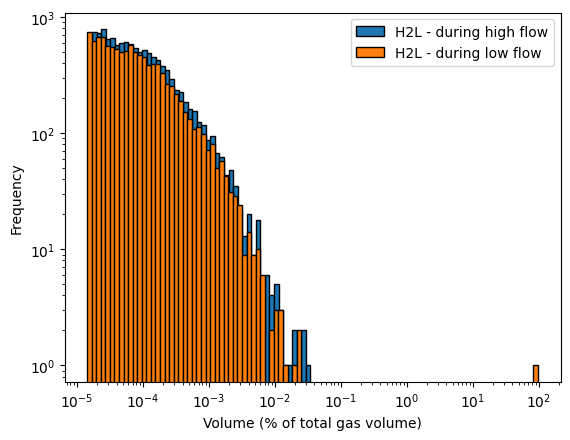

The total number of ganglia during high flow in H2L is:  12442
The total number of ganglia during low flow in H2L is:  10835
The percentage decrease is:  12.915929914804694
Change in ganglia volume is:  -1.51136421890281


In [94]:
#ganglia analysis 
import csv

reader = open("E:/New reconstructions/segmented/fully_segmented_sparse/H2L_high.csv", "r")
reader = csv.reader(reader, delimiter=";")

# Read the first row which contains the headers
headers = next(reader)
volume_index = headers.index("Volume3d")


volume_H2L_high = []
# Read each row and extract the values for the desired columns
for row in reader:
    volume_value = row[volume_index]
    # Assign the values to the respective variables
    volume_H2L_high.append(float(volume_value))


reader = open("E:/New reconstructions/segmented/fully_segmented_sparse/H2L_low.csv", "r")
reader = csv.reader(reader, delimiter=";")
headers = next(reader)

volume_H2L_low = []
# Read each row and extract the values for the desired columns
for row in reader:
    volume_value = row[volume_index]
    # Assign the values to the respective variables
    volume_H2L_low.append(float(volume_value))



# Plot the histogram
data_volume_H2L_high     = [value for value in volume_H2L_high if value > 25] 
weighted_volume_H2L_high = [value*100/sum(data_volume_H2L_high) for value in data_volume_H2L_high] 

data_volume_H2L_low     = [value for value in volume_H2L_low if value > 25]
weighted_volume_H2L_low = [value*100/sum(data_volume_H2L_low) for value in data_volume_H2L_low] 

print(max(weighted_volume_H2L_high)) 
print(max(weighted_volume_H2L_low)) 

plt.hist(weighted_volume_H2L_high, bins=np.logspace(np.log10(min(weighted_volume_H2L_high)), np.log10(max(weighted_volume_H2L_high)), 100), edgecolor='black')
plt.hist(weighted_volume_H2L_low, bins=np.logspace(np.log10(min(weighted_volume_H2L_low)), np.log10(max(weighted_volume_H2L_low)), 100), edgecolor='black')

# Set the labels and title
plt.xlabel(r"Volume (% of total gas volume)")
plt.ylabel("Frequency")
plt.xscale('log')
plt.legend(['H2L - during high flow', 'H2L - during low flow'])
plt.show()


print("The total number of ganglia during high flow in H2L is: ", len(weighted_volume_H2L_high))
print("The total number of ganglia during low flow in H2L is: ", len(weighted_volume_H2L_low))
print("The percentage decrease is: ", (len(weighted_volume_H2L_high)- len(weighted_volume_H2L_low))*100/len(weighted_volume_H2L_high))
print("Change in ganglia volume is: ", (sum(data_volume_H2L_high) - sum(data_volume_H2L_low))*100/ sum(data_volume_H2L_high))

In [43]:

label_gas_image9 = skimage.measure.label(gas_image9[650:700,:,:], connectivity=3)



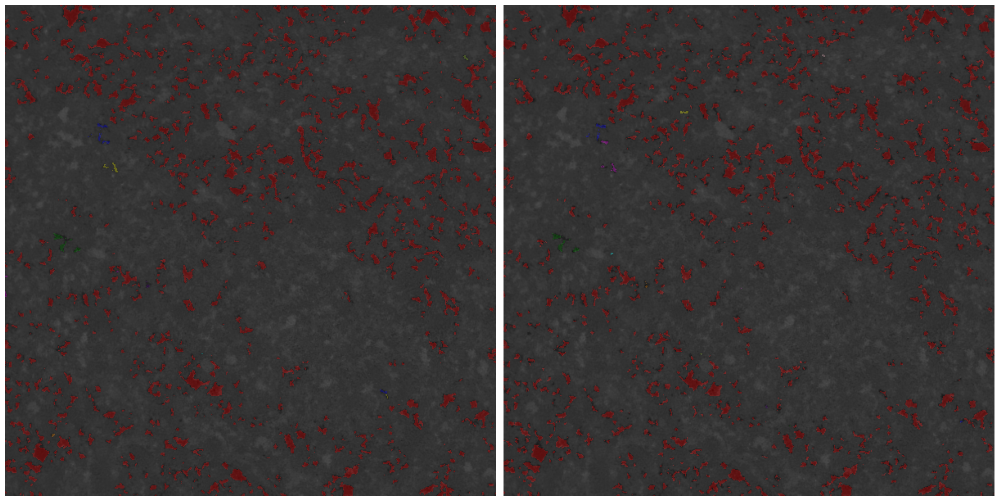

In [94]:
# label image regions
label_image  = label(gas_image9[488:738,:,:])
label_image2 = label(gas_image11[488:738,:,:])


image_label_overlay  = label2rgb(label_image[112, 300:900,300:900], image=denoise_flow[12,300:900,300:900], bg_label=0)
image_label_overlay2 = label2rgb(label_image2[112, 300:900,300:900], image=denoise_flow[12,300:900,300:900], bg_label=0)



fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20),
                       sharex=True, sharey=True)

ax[0].imshow(image_label_overlay,cmap='gray')
ax[0].axis('off')


ax[1].imshow(image_label_overlay2,cmap='gray')
ax[1].axis('off')

fig.tight_layout()
plt.show()



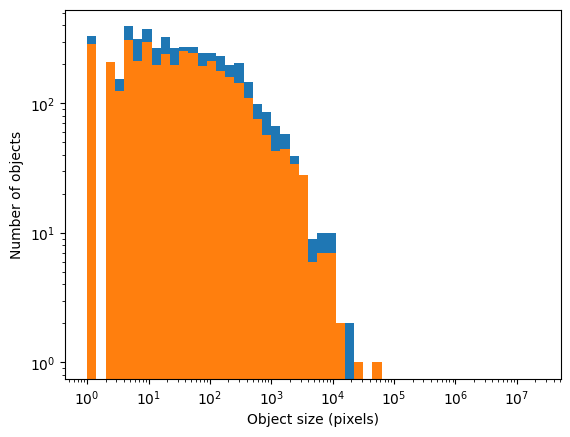

In [98]:
label_sizes  = np.bincount(label_image.ravel())[1:]
label_sizes2 = np.bincount(label_image2.ravel())[1:]

# Create size distribution plot
plt.hist(label_sizes, bins=np.logspace(0, np.log10(np.max(label_sizes)), 50))
plt.hist(label_sizes2, bins=np.logspace(0, np.log10(np.max(label_sizes)), 50), 'r')

plt.gca().set_xscale("log")
plt.gca().set_yscale("log")
plt.xlabel("Object size (pixels)")
plt.ylabel("Number of objects")
plt.show()

### Potential to save data into sparse format

In [64]:

z = 0 
#os.mkdir('E:\\New reconstructions\\segmented\\fully_segmented_sparse\\' + folders[z][0:-8])
for i in range(0,len(seg_image)):
    slice = seg_image[i,:,:]
    slice[slice[:,:] == 3] =0  #set the rock grains to 0 
    sparse_slice = sparse.csr_matrix(slice)
    filename = folders[z][0:-8] + '_' + str(i)
    #save the sparse file 
    os.environ['dir_name'] = 'E:\\New reconstructions\\segmented\\fully_segmented_sparse\\' + folders[z][0:-8]
    os.chdir(os.environ['dir_name'])
    sparse.save_npz(filename, sparse_slice)

In [190]:
z_widget = widgets.IntSlider(
    value=2,
    min=0,
    max=30,
    step=1,
)


overlay_widget = widgets.RadioButtons(
    options=[True, False],
    description='Overlay:',
    disabled=False,
)


def view_slice(img: np.ndarray, z: int, overlay: bool, mask: bool) -> None:
    depth, h, w = img.shape
    assert isinstance(img, np.ndarray)
    assert isinstance(z, int)
    assert isinstance(overlay, bool)
    assert 0 <= z < depth

    slice = img[z, :, :]

    if overlay:
        slice = utils.preprocess(slice)
        mask  = mask[z, :, :]
        slice = utils.sanity_check(slice, mask)
    fig = plt.figure(figsize=(20, 12))
    plt.imshow(slice, cmap='gray')
    plt.show()


widgets.interact(view_slice, img=widgets.fixed(dry_data[60:71, 300:800, 300:800]), z=z_widget, overlay=overlay_widget, mask = widgets.fixed(dry_scan[660:671, 300:800, 300:800]))

interactive(children=(IntSlider(value=2, description='z', max=30), RadioButtons(description='Overlay:', option…

<function __main__.view_slice(img: numpy.ndarray, z: int, overlay: bool, mask: bool) -> None>

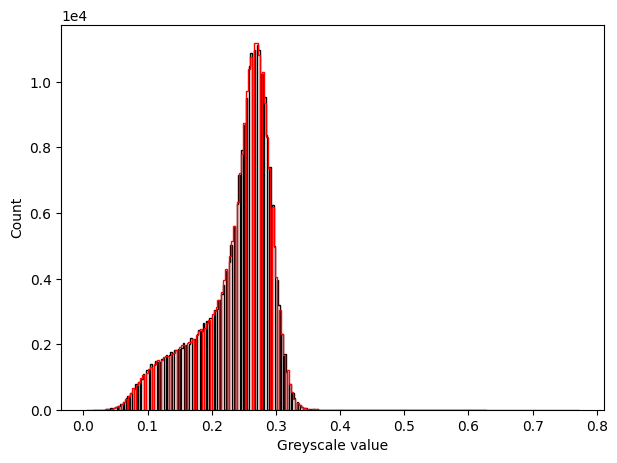

In [217]:
bins = 255
fig, ax = plt.subplots(figsize =(7, 5))
ax.set_xlabel('Greyscale value')
ax.set_ylabel('Count')

ax.hist(dry_data[60,300:800,300:800].ravel()/255, bins=bins, histtype='step', color='black')
ax.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))

ax.hist(dry_data[61,300:800,300:800].ravel()/255, bins=bins, histtype='step', color='red')
ax.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))

### Catherine's attempt to do MB analysis herself

In [99]:
#load in files from the pnextract 
node2 = [i.strip().split() for i in open("./Sharon_Cath_z1866_node2.dat").readlines()]
node1 = [i.strip().split() for i in open("./Sharon_Cath_z1866_node1.dat").readlines()]

voxel = 20*10**-6 #voxel size (I think is 20 microns)
idx   = []
MB_xs = [] 
MB_ys = [] 
MB_zs = [] 
MB_radii = [] 

for i in range(len(node1)): 
    idx.append(node1[i][0])
    MB_zs.append(node1[i][1])
    MB_xs.append(node1[i][3])
    MB_ys.append(node1[i][2])
    MB_radii.append(node2[i][2])

MB_radii_voxel    = [float(entry)/voxel for entry in MB_radii]
MB_xs_voxel       = [float(entry)/voxel for entry in MB_xs]
MB_ys_voxel       = [float(entry)/voxel for entry in MB_ys]
MB_zs_voxel       = [float(entry)/voxel for entry in MB_zs]


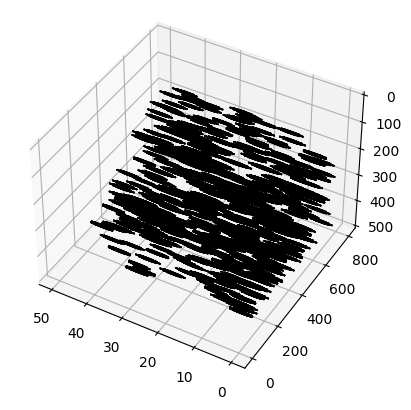

In [100]:
#just note with referencing, the full images have to match, can't load in a section of the image and the full MB file 

dry_scan = skimage.io.imread('E:\\New reconstructions\\segmented\\fully_segmented\\Dry_from_flowScans_1400x1400x1866.tif')
z1=0
z2=50
x1=0 
x2=500
y1=0
y2=800
image = utils.preprocess(dry_scan[z1:z2, y1:y2, x1:x2])
voxelarray = np.zeros_like(image)


def MB_analysis(z,y,x, radius): 
    x = round(x) #slices in array must be integers 
    y = round(y) 
    z = round(z)
    #input is 3D space, ball with radius, and x, y, z location of the ball
    def create_MB(array, structure, z,y,x):
        if z+structure.shape[0] <= array.shape[0] and y+structure.shape[1] <= array.shape[1] and x+structure.shape[2] <= array.shape[2]: 
            array[z:z+structure.shape[0],y:y+structure.shape[1],x:x+structure.shape[2]]= structure
        else:
            pass
        return array

    sphere = skimage.morphology.ball(radius)
    create_MB(voxelarray,sphere, z,y,x)


    return voxelarray

ax = plt.figure().add_subplot(projection='3d')

for i in range(0, len(MB_xs_voxel)):
    if x1 < MB_xs_voxel[i] < x2  and  y1 < MB_ys_voxel[i] < y2 and z1< MB_zs_voxel[i] < z2 and int(MB_radii_voxel[i]) > 2: 
        MB_analysis( z= (MB_zs_voxel[i]- z1), y = (MB_ys_voxel[i] -y1), x=(MB_xs_voxel[i] - x1),  radius = (MB_radii_voxel[i]))


ax.voxels(voxelarray, edgecolor='k')
#ax.voxels(image, edgecolor='r')
ax.view_init(-140, 60)
plt.show()



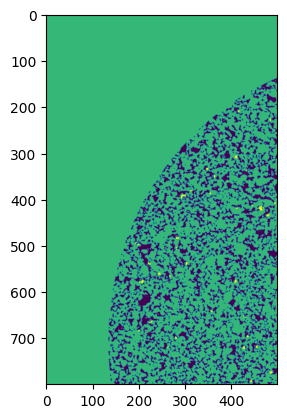

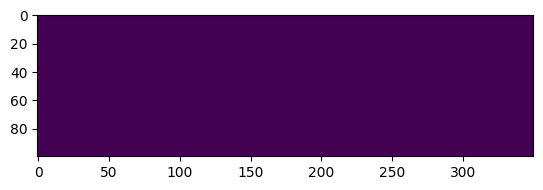

In [101]:
#working out the pore occupancy 
plt.imshow(voxelarray[28,:,:] + 2*image[28,:,:])
plt.show()


plt.imshow(image[28,0:100,50:400])
plt.show()